# CHEST X-RAY COVID-19 Analysis

### Dataset

The dataset that was used for the analysis was the COVIDx CXR-2 which comprised
over 30,000 chest X-ray images across almost 17,000 patients. The dataset's primary aim was to be
used in training and validating models for COVID-19 detection from the chest X-Ray images. The
dataset was constructed using the COVID-Net Open-Source Initiative which contains the largest
number of COVID-19-positive cases available. The dataset is primarily meant for
researchers and data scientists to build accurate and practical deep-learning solutions for the
detection of COVID-19 cases and is not a production-ready solution. A subset of 4000 samples was
processed and analyzed from this dataset.

In [1]:
import os
import pandas as pd
import cv2
import numpy
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras import layers
from tensorboard import notebook
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.utils import resample
from sklearn.utils import shuffle
from time import time

import sklearn
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import precision_score, recall_score, f1_score, classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Data Loading and Pre-processing

In [233]:
#loading the text files 
train_df = pd.read_csv('C:\\Users\\zzzim\\Desktop\\IFN646Project\\archive\\train.txt', sep=" ", header=None)

#rename column
train_df.columns=['id', 'filename', 'class', 'source']

# Dropping unnecessary coloumn
train_df=train_df.drop(['id', 'source'], axis=1 )

test_df = pd.read_csv('C:\\Users\\zzzim\\Desktop\\IFN646Project\\archive\\test.txt', sep=" ", header=None)
test_df.columns=['id', 'filename', 'class', 'source' ]
test_df=test_df.drop(['id', 'source'], axis=1 )

train_df.head()

,filename,class
0,ARDSSevere.png,negative
1,acute-respiratory-distress-syndrome-ards-1.jpg,negative
2,acute-respiratory-distress-syndrome-ards.jpg,negative
3,ards-secondary-to-tiger-snake-bite.png,negative
4,pneumocystis-pneumonia-2-PA.png,negative


In [4]:
train_path = #directory path

test_path = #directory path

In [5]:
#check count of each class
train_df['class'].value_counts()

positive    15994
negative    13992
Name: class, dtype: int64

In [7]:
#lets consider only 2000 class of each 
#Balancing Class
#Getting the class into seperate DF
positive = train_df[train_df['class']=='positive'] 
negative  = train_df[train_df['class']=='negative']

#The sample size of 1000 for each class with the resample function
df_majority_downsampled_positive = resample(positive, replace = True, n_samples = 2000) 
df_majority_downsampled_negative = resample(negative, replace = True, n_samples = 2000) 

train_df = pd.concat([df_majority_downsampled_positive, df_majority_downsampled_negative])

#To randomize the sequence of the concatenated paositive, negative class DF
train_df = shuffle(train_df) 

In [8]:
#check training set class count
train_df['class'].value_counts()

negative    2000
positive    2000
Name: class, dtype: int64

# DCNN modelling

A simple Deep Convolution Neural Network (DCNN) was built to classify these X-Ray images. The
kernel filter size for the convolution layers is set to 3x3. This will allow each layer to see a smaller
patcher of the image to extract mode localized features within an X-ray image. The kernel filter size
of the first layer is set to 5x5 as the input image representation is larger as compared to the other
layers. The main concern about the smaller filter size is that larger features will not be able to be
captured. This has been dealt with by increasing the number of convolution layers. A max-pooling
layer is stacked after each convolution layer to reduce the size of the representation and only keep
the important features from each convolution layer. The final representation is flattened to convert
all the resultant 2-D arrays from pooled feature maps into a single long continuous linear vector. A
dense layer with sigmoid activation, which is used to predict the probability of a binary variable is
used in the final layer to classify the X-ray image. 

In [13]:
#Converting class into binary output (positive, negative -> 1,0)
train_df['class'][train_df['class'] =='positive'] = 1
train_df['class'][train_df['class'] =='negative'] = 0

test_df['class'][test_df['class'] =='positive'] = 1
test_df['class'][test_df['class'] =='negative'] = 0
train_df

,filename,class
13927,b0780603-efa4-453c-a51c-a23c4efedfc1.png,0
28374,A946387-12-30-1900-NA-CHEST_AP_PORT-24961-2.00...,1
7413,ab09b1a0-4585-4917-9214-bc688caba9fa.png,0
11621,3d413032-b091-4f90-a131-17bc1eeb0647.png,0
29573,A763364-01-23-1901-NA-CHEST_AP_PORT-19312-1.00...,1
...,...,...
12323,6a007557-7c16-4726-b91f-2da91ee8f798.png,0
6598,944d1326-6304-4b1c-b52b-a17df7fef124.png,0
453,kjr-21-e25-g001-l-a.jpg,1
6248,8c4913dd-4992-4c62-9e48-37f2fdcf6c18.png,0


In [14]:
#Define function to load dataset 
def load_set(df, image_path, target_size = (100, 100), target_colour = cv2.COLOR_BGR2RGB):
    
    # create storage
    # first for likley model inputs
    x = {}
    x['images'] = []

    # now for likely model output
    y= []
    
    for i, row in df.iterrows():
        y.append(row['class'])
        x["images"].append(tf.image.resize_with_pad(cv2.cvtColor(cv2.imread(os.path.join(image_path, row['filename'])), target_colour) / 255.0, target_size[1], target_size[0]).numpy())# Adding a channel dimension to the images

        
    x['images'] = numpy.array(x['images'])
    y = numpy.array(y)
    
    return x, y
        
def load_data(base_path, target_size = (100, 100)):
    
    train_x, train_y = load_set(train_df, os.path.join(base_path, 'train'), target_size = target_size)
    test_x, test_y = load_set(test_df, os.path.join(base_path, 'test'), target_size = target_size)    
    
    return train_x, train_y, test_x, test_y

def plot_images(images):
    fig = plt.figure(figsize=[100, 100])
    for i in range(50):
        ax = fig.add_subplot(5, 10, i + 1)
        ax.imshow(images[i,:], cmap=plt.get_cmap('Greys'))
        ax.axis('off')
        

def eval_model(model, x_test, y_test):
    test_scores = model.evaluate(x_test, y_test)
    print('Test loss:', test_scores[0])
    print('Test accuracy:', test_scores[1])

    pred = model.predict(x_test);
    #indexes = tf.argmax(pred, axis=1)
    indexes = numpy.round(pred).tolist()
    i = tf.cast([], tf.int32)
    indexes = tf.gather_nd(indexes, i)
    cm = confusion_matrix(y_test, indexes)
    fig = plt.figure(figsize=[10, 10])
    ax = fig.add_subplot(1, 1, 1)
    c = ConfusionMatrixDisplay(cm, display_labels=[1, 0])
    c.plot(ax = ax)

    print(classification_report(y_test, indexes))

In [15]:
train_x, train_y, test_x, test_y = load_data('C:\\Users\\zzzim\\Desktop\\IFN646Project\\archive\\', target_size = (500, 600)) #Load dataset

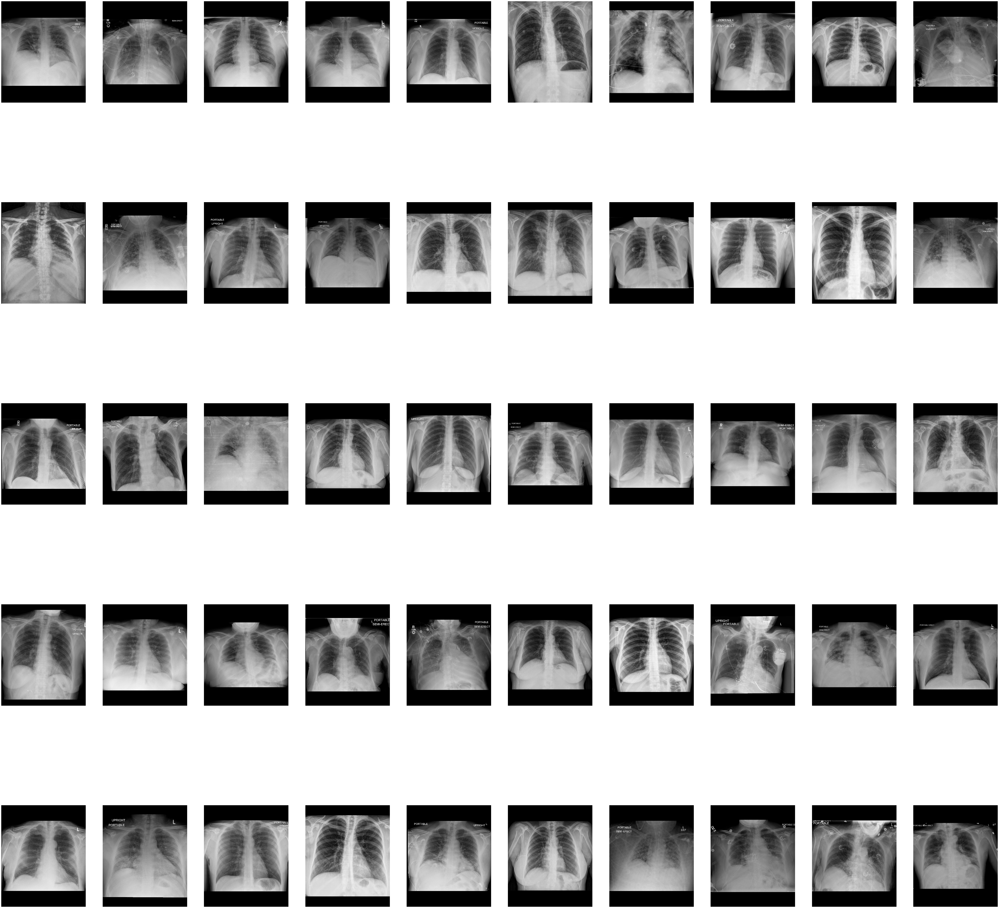

In [16]:
#some sample images from test set
plot_images(test_x['images'])

In [220]:
#DCNN models
inputs = keras.Input(shape=(600, 500, 3), name='img')

x = layers.Conv2D(filters=8, kernel_size=(5,5), activation='relu')(inputs)
x = layers.MaxPool2D(pool_size=(2, 2))(x)
x = layers.Conv2D(filters=16, kernel_size=(3,3), activation='relu')(x)
x = layers.MaxPool2D(pool_size=(2, 2))(x)
x = layers.Conv2D(filters=32, kernel_size=(3,3), activation='relu')(x)
x = layers.MaxPool2D(pool_size=(2, 2))(x)
x = layers.Conv2D(filters=64, kernel_size=(3,3), activation='relu')(x)
x = layers.MaxPool2D(pool_size=(2, 2))(x)
x = layers.Conv2D(filters=128, kernel_size=(3,3), activation='relu')(x)
x = layers.Flatten()(x)

outputs = layers.Dense(1, activation='sigmoid')(x)

# build the model, and print the summary
model_cnn = keras.Model(inputs=inputs, outputs=outputs, name='covid_xray_cnn_model')
model_cnn_weights= keras.Model(inputs=inputs, outputs=outputs, name='covid_xray_cnn_weight_model')
model_cnn_weights2= keras.Model(inputs=inputs, outputs=outputs, name='covid_xray_cnn_weight2_model')
model_cnn_imgaug= keras.Model(inputs=inputs, outputs=outputs, name='covid_xray_cnn_imgaug_model')
model_cnn.summary()

Model: "covid_xray_cnn_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 img (InputLayer)            [(None, 600, 500, 3)]     0         
                                                                 
 conv2d_40 (Conv2D)          (None, 596, 496, 8)       608       
                                                                 
 max_pooling2d_32 (MaxPoolin  (None, 298, 248, 8)      0         
 g2D)                                                            
                                                                 
 conv2d_41 (Conv2D)          (None, 296, 246, 16)      1168      
                                                                 
 max_pooling2d_33 (MaxPoolin  (None, 148, 123, 16)     0         
 g2D)                                                            
                                                                 
 conv2d_42 (Conv2D)          (None, 146, 121, 

In [221]:
#Basic DCNN model
model_cnn.compile(loss=['binary_crossentropy', keras.losses.BinaryCrossentropy(from_logits=True)],
              optimizer=keras.optimizers.Adam(learning_rate=0.001),
              metrics=['accuracy'])

callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=5)

history = model_cnn.fit(train_x["images"], train_y,
                    batch_size=32,
                    epochs=30,
                    validation_split=0.2,
                    callbacks=[callback])

Epoch 1/30
80/80 [==============================] - 265s 3s/step - loss: 0.5415 - accuracy: 0.7121 - val_loss: 0.3221 - val_accuracy: 0.8656
Epoch 2/30
80/80 [==============================] - 260s 3s/step - loss: 0.2600 - accuracy: 0.8930 - val_loss: 0.1926 - val_accuracy: 0.9312
Epoch 3/30
80/80 [==============================] - 262s 3s/step - loss: 0.1898 - accuracy: 0.9246 - val_loss: 0.2059 - val_accuracy: 0.9281
Epoch 4/30
80/80 [==============================] - 261s 3s/step - loss: 0.1603 - accuracy: 0.9418 - val_loss: 0.1866 - val_accuracy: 0.9234
Epoch 5/30
80/80 [==============================] - 255s 3s/step - loss: 0.1327 - accuracy: 0.9480 - val_loss: 0.1707 - val_accuracy: 0.9453
Epoch 6/30
80/80 [==============================] - 255s 3s/step - loss: 0.1360 - accuracy: 0.9492 - val_loss: 0.1791 - val_accuracy: 0.9391
Epoch 7/30
80/80 [==============================] - 247s 3s/step - loss: 0.0976 - accuracy: 0.9621 - val_loss: 0.1585 - val_accuracy: 0.9547
Epoch 8/30
80

13/13 [==============================] - 5s 327ms/step - loss: 0.2732 - accuracy: 0.9300
Test loss: 0.2731844186782837
Test accuracy: 0.9300000071525574
13/13 [==============================] - 4s 310ms/step
              precision    recall  f1-score   support

           0       0.92      0.94      0.93       200
           1       0.94      0.92      0.93       200

    accuracy                           0.93       400
   macro avg       0.93      0.93      0.93       400
weighted avg       0.93      0.93      0.93       400



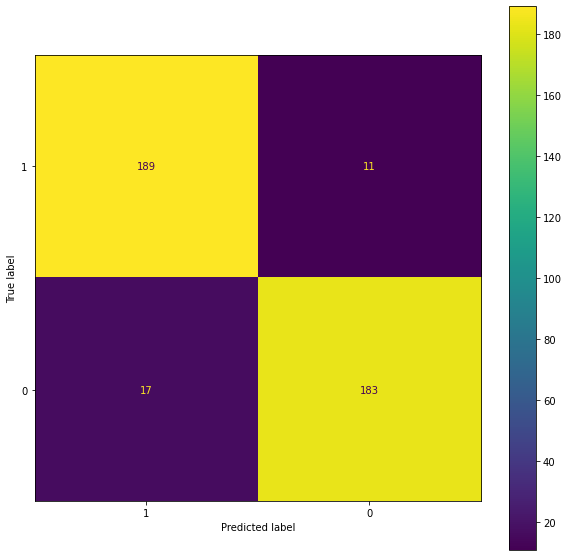

In [226]:
#Result of Basic DCNN Model
eval_model(model_cnn, test_x['images'], test_y)

## DCNN With Class Weights

The performance of the DCNN is promising and seems to capture the features of COVID-19 well.
However, there are COVID-19-positive patients that the DCNN failed to capture. As the main goal of
the classifier is the ability to detect COVID-19 patients based on X-ray images, it is crucial to identify
the COVID-19 patients. Failure of detection could lead to the further spread of the virus or the death
of the patients. A class weight is applied to the DCNN to set a higher weight on the positive patients
to decrease the false positive counts by either increasing the true positive or false negative counts.
The increment of false negatives is tolerable as the X-ray images may show signs of slight
complication leading up to being classified as positive. In this scenario, it is worth flagging these
patients for a check-up.
A class weight of 1 to 5 and 1 to 10 is applied to the DCNN. This would treat every instance of
negative patients as 5/10 instances of positive patients. The two different class weights are trained
with the DCNN separately to observe if class weight can improve the DCNN model precision.

In [23]:
# DCNN With Class Weights
model_cnn_weights.compile(loss=['binary_crossentropy', keras.losses.BinaryCrossentropy(from_logits=True)],
              optimizer=keras.optimizers.Adam(learning_rate=0.001),
              metrics=['accuracy'])

callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=5)

class_weight = {0: 5., 1: 1.} #treat every instance of class 0 as 5 instances of class 1
history_classweigth = model_cnn_weights.fit(train_x["images"], train_y,
                    class_weight=class_weight,
                    batch_size=32,
                    epochs=30,
                    validation_split=0.2,
                    callbacks=[callback])

Epoch 1/30
80/80 [==============================] - 172s 2s/step - loss: 1.1198 - accuracy: 0.5992 - val_loss: 0.4626 - val_accuracy: 0.7875
Epoch 2/30
80/80 [==============================] - 163s 2s/step - loss: 0.5050 - accuracy: 0.8512 - val_loss: 0.2468 - val_accuracy: 0.9156
Epoch 3/30
80/80 [==============================] - 199s 2s/step - loss: 0.4110 - accuracy: 0.8879 - val_loss: 0.2610 - val_accuracy: 0.8938
Epoch 4/30
80/80 [==============================] - 196s 2s/step - loss: 0.4553 - accuracy: 0.8758 - val_loss: 0.2292 - val_accuracy: 0.9125
Epoch 5/30
80/80 [==============================] - 195s 2s/step - loss: 0.3322 - accuracy: 0.9121 - val_loss: 0.2113 - val_accuracy: 0.9234
Epoch 6/30
80/80 [==============================] - 197s 2s/step - loss: 0.2462 - accuracy: 0.9375 - val_loss: 0.2054 - val_accuracy: 0.9281
Epoch 7/30
80/80 [==============================] - 196s 2s/step - loss: 0.2018 - accuracy: 0.9484 - val_loss: 0.1766 - val_accuracy: 0.9469
Epoch 8/30
80

13/13 [==============================] - 6s 308ms/step - loss: 0.4652 - accuracy: 0.9175
Test loss: 0.4652375280857086
Test accuracy: 0.9175000190734863
13/13 [==============================] - 4s 302ms/step
              precision    recall  f1-score   support

           0       0.88      0.97      0.92       200
           1       0.97      0.86      0.91       200

    accuracy                           0.92       400
   macro avg       0.92      0.92      0.92       400
weighted avg       0.92      0.92      0.92       400



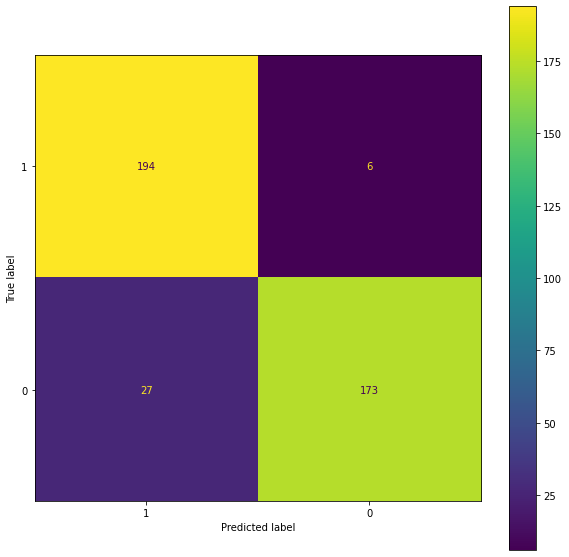

In [25]:
#Result of DCNN With Class Weights
eval_model(model_cnn_weights, test_x['images'], test_y)

In [35]:
# DCNN with Class Weights 10 to 1
model_cnn_weights2.compile(loss=['binary_crossentropy', keras.losses.BinaryCrossentropy(from_logits=True)],
              optimizer=keras.optimizers.Adam(learning_rate=0.001),
              metrics=['accuracy'])

callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=5)

class_weight = {0: 10., 1: 1.} #treat every instance of class 0 as 5 instances of class 1
history_classweigth = model_cnn_weights2.fit(train_x["images"], train_y,
                    class_weight=class_weight,
                    batch_size=32,
                    epochs=30,
                    validation_split=0.2)

Epoch 1/30
80/80 [==============================] - 177s 2s/step - loss: 1.4920 - accuracy: 0.5383 - val_loss: 0.5623 - val_accuracy: 0.7250
Epoch 2/30
80/80 [==============================] - 164s 2s/step - loss: 0.8080 - accuracy: 0.7684 - val_loss: 0.2827 - val_accuracy: 0.8813
Epoch 3/30
80/80 [==============================] - 165s 2s/step - loss: 0.6595 - accuracy: 0.8207 - val_loss: 0.5077 - val_accuracy: 0.8078
Epoch 4/30
80/80 [==============================] - 163s 2s/step - loss: 0.5989 - accuracy: 0.8371 - val_loss: 0.3624 - val_accuracy: 0.8562
Epoch 5/30
80/80 [==============================] - 165s 2s/step - loss: 0.5054 - accuracy: 0.8695 - val_loss: 0.2568 - val_accuracy: 0.9094
Epoch 6/30
80/80 [==============================] - 163s 2s/step - loss: 0.4130 - accuracy: 0.8922 - val_loss: 0.3607 - val_accuracy: 0.8609
Epoch 7/30
80/80 [==============================] - 163s 2s/step - loss: 0.3585 - accuracy: 0.9113 - val_loss: 0.2963 - val_accuracy: 0.8969
Epoch 8/30
80

13/13 [==============================] - 5s 272ms/step - loss: 0.7977 - accuracy: 0.8775
Test loss: 0.7976769804954529
Test accuracy: 0.8774999976158142
13/13 [==============================] - 4s 271ms/step
              precision    recall  f1-score   support

           0       0.83      0.95      0.89       200
           1       0.95      0.80      0.87       200

    accuracy                           0.88       400
   macro avg       0.89      0.88      0.88       400
weighted avg       0.89      0.88      0.88       400



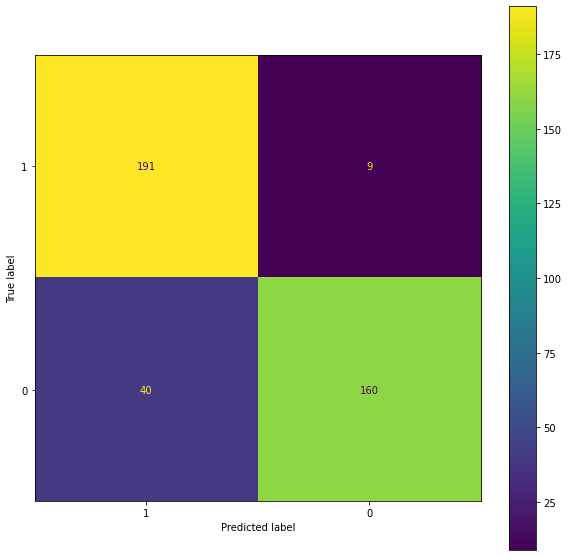

In [36]:
#DCNN With Class Weight  10 to 1
eval_model(model_cnn_weights2, test_x['images'], test_y)

## Data Augmentation DCNN

Data augmentation is a technique that is used to generate additional data artificially derived from
existing training data. The existence of data inconsistency in the X-ray image training set has
demanded the use of image augmentation. The X-ray images are inconsistent, and these images are
taken from various angles. Some X-ray images have tubes or cords over the body, which could be a
string indicator or COVID positive as these patients are being hospitalized. Furthermore, the
existence of text on top or below the X-ray images can be a misrepresentation and misleading
information to the DCNN classifier. Data augmentation is used to generate more variation of the Xray images that may or may not cover the text on these images or potentially rotate the position of
the X-ray to a better angle. 

In [51]:
data_augmentation = keras.Sequential([
  layers.experimental.preprocessing.RandomRotation(0.01),
  layers.experimental.preprocessing.RandomContrast(factor=0.1),
  layers.experimental.preprocessing.RandomZoom(0.1),
  layers.experimental.preprocessing.RandomTranslation(height_factor=(-0.05, 0.05), width_factor=(-0.05, 0.05))
])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


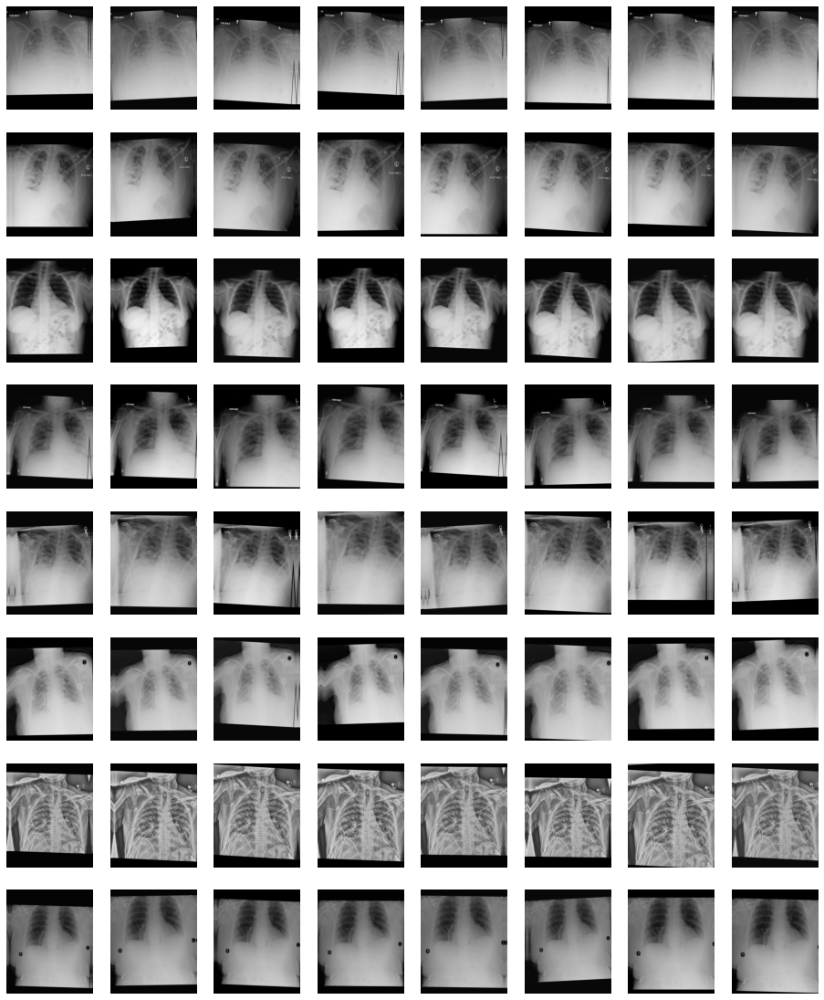

In [52]:
#Print some samples of augmented data
fig = plt.figure(figsize=[20, 25])
for i in range(8):
    for j in range(8):
        ax = fig.add_subplot(10, 10, i*10 + (j + 1))
        augmented_image = data_augmentation(tf.expand_dims(train_x['images'][i,:,:,:],0))
        plt.imshow(augmented_image[0])
        plt.axis("off")

In [53]:
#Include data augmentation directly in the DCNN model

model_aug = model_cnn_imgaug
# remove first layer- the input
model_aug.layers.pop(0)
# create a new input
input_layer = keras.Input(shape=(600, 500, 3, ), name='img')
# pass the input to our augmenter
augmented = data_augmentation(input_layer)
# pass the augmented input to the rest of the model
output = model_aug(augmented)

In [54]:
new_model = keras.Model(inputs=input_layer, outputs=output)
new_model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 img (InputLayer)            [(None, 600, 500, 3)]     0         
                                                                 
 sequential_2 (Sequential)   (None, 600, 500, 3)       0         
                                                                 
 covid_xray_cnn_imgaug_model  (None, 1)                212817    
  (Functional)                                                   
                                                                 
Total params: 212,817
Trainable params: 212,817
Non-trainable params: 0
_________________________________________________________________


In [55]:
new_model.compile(loss=['binary_crossentropy', keras.losses.BinaryCrossentropy(from_logits=True)],
              optimizer=keras.optimizers.Adam(learning_rate=0.001),
              metrics=['accuracy'])


callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=10)

class_weight = {0: 5., 1: 1.} #treat every instance of class 0 as 5 instances of class 1
history2 = new_model.fit(train_x["images"], train_y,
                    class_weight=class_weight,
                    batch_size=32,
                    epochs=30,
                    validation_split=0.25,
                    callbacks=[callback])

Epoch 1/30
75/75 [==============================] - 263s 3s/step - loss: 1.2409 - accuracy: 0.5650 - val_loss: 0.5605 - val_accuracy: 0.7150
Epoch 2/30
75/75 [==============================] - 251s 3s/step - loss: 0.9781 - accuracy: 0.6862 - val_loss: 0.5262 - val_accuracy: 0.7538
Epoch 3/30
75/75 [==============================] - 253s 3s/step - loss: 0.8365 - accuracy: 0.7250 - val_loss: 0.4600 - val_accuracy: 0.7688
Epoch 4/30
75/75 [==============================] - 255s 3s/step - loss: 0.7944 - accuracy: 0.7408 - val_loss: 0.5232 - val_accuracy: 0.7588
Epoch 5/30
75/75 [==============================] - 256s 3s/step - loss: 0.7006 - accuracy: 0.7842 - val_loss: 0.2870 - val_accuracy: 0.8712
Epoch 6/30
75/75 [==============================] - 254s 3s/step - loss: 0.6731 - accuracy: 0.7825 - val_loss: 0.2635 - val_accuracy: 0.8863
Epoch 7/30
75/75 [==============================] - 253s 3s/step - loss: 0.6127 - accuracy: 0.8087 - val_loss: 0.3555 - val_accuracy: 0.8400
Epoch 8/30
75

13/13 [==============================] - 6s 330ms/step - loss: 0.2223 - accuracy: 0.9275
Test loss: 0.22234582901000977
Test accuracy: 0.9275000095367432
13/13 [==============================] - 4s 293ms/step
              precision    recall  f1-score   support

           0       0.89      0.98      0.93       200
           1       0.98      0.88      0.92       200

    accuracy                           0.93       400
   macro avg       0.93      0.93      0.93       400
weighted avg       0.93      0.93      0.93       400



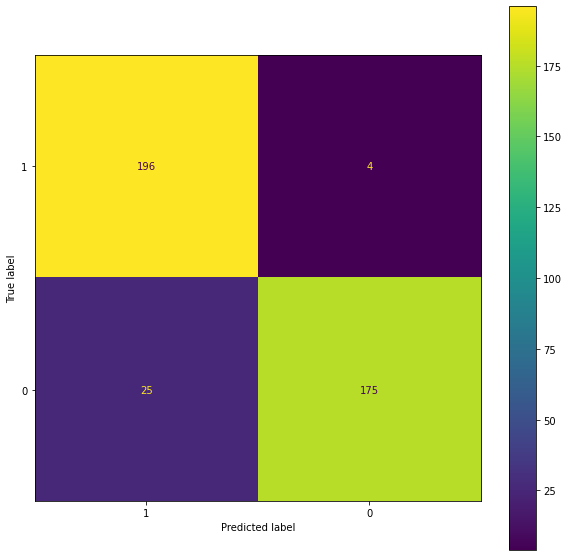

In [56]:
#Result of DCNN with data augmentation
eval_model(new_model, test_x['images'], test_y)

# Lime Model for DCNN interpretation

Local Interpretable Model-agnostic Explanations
The COVID-19 features expected to be extracted by the classifier (DCNN) can be shadows formed by
abnormalities inside the body. These abnormalities could be a sign of infections around the soft
tissues surrounding the lung areas. A local Interpretable Model-agnostic Explanations model is
utilized to explore the image predictions from the DCNN model. This model will allow us to visualize
and identify the features of COVID-19 within a lung X-ray.
These “shadows” formed by abnormalities can vary very differently in terms of size, shape, and
clarity. The image segmentation method selected for this study is Quickshift, which is an algorithm
that can capture more complex and random features from an image. The kernel size considered for
this study range from 1 to 5 is selected to capture fewer clusters/features. Whereas the maximum
distance considered are 100, 200, 300, and 500. These parameters are all experimented with to find
the suitable number of features/clusters while having the right density of the shadow. The final
parameters selected for the segmentation algorithm are a kernel size of 5 and a maximum distance
of 100. 

The LIME model is built with the test set and predictions of the test set with the DCNN model. The
original X-ray and the masked X-ray (highlighting features) will be placed side to side to identify the
difference and the “shadows” that may be a sign of COVID-19. The two cohorts of positive and
negative COVID-19 X-rays are used to visualize and explore the differential pattern in these X-rays.

In [240]:
import lime
from lime import lime_image
from lime.wrappers.scikit_image import SegmentationAlgorithm

explainer = lime_image.LimeImageExplainer() 

#segmentation algorithm
segmenter = SegmentationAlgorithm('quickshift', kernel_size=5, max_dist=100)

In [135]:
#Copy the test set and get prediction with DCNN data augmentation
X_test_copy = test_y.copy()
test_loss, test_acc = new_model.evaluate(x=test_x['images'], y=test_y)
print('Test acc: ', test_acc)

13/13 [==============================] - 4s 271ms/step - loss: 0.2223 - accuracy: 0.9275
Test acc:  0.9275000095367432


In [136]:
y_pred = new_model.predict(test_x['images'])
print('y_pred shape: ', y_pred.shape)

13/13 [==============================] - 4s 267ms/step
y_pred shape:  (400, 1)


In [137]:
#Seperating the class from DCNN result
class_0_indices = []
class_1_indices = []

#Prediction is continous due to binary classiication with sigmoid activation
for i in range(y_pred.shape[0]):
    j = 1 if y_pred[i] > 0.5 else 0
    
    if test_y[i] == 1 and j == 1:
        class_1_indices.append(i)
        
    if test_y[i] == 0 and j == 0:
        class_0_indices.append(i)

Text(0.5, 1.0, 'COVID: 1')

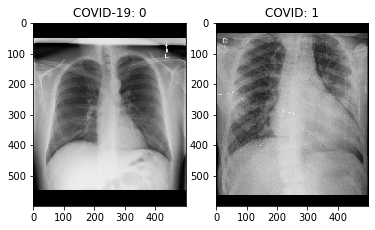

In [208]:
# two testing samples to be explained
plt.subplot(1, 2, 1)

negative_sample_idx = class_0_indices[42] 
negative_sample_test = test_x['images'][negative_sample_idx] 

plt.imshow(negative_sample_test,
           interpolation = 'none')
plt.title('COVID-19: {}'.format(test_y[negative_sample_idx]))


plt.subplot(1, 2, 2)

positive_sample_idx = class_1_indices[48] #40
positive_sample_test =   test_x['images'][positive_sample_idx]

plt.imshow(positive_sample_test, 
           interpolation = 'none')
plt.title('COVID: {}'.format(test_y[positive_sample_idx]))

## Positive Case LIME

In [209]:
%%time
explanation_1 = explainer.explain_instance(positive_sample_test.astype('double'), 
                                         classifier_fn = new_model.predict, 
                                         top_labels=2, 
                                         hide_color=0, # 0 - gray 
                                         num_samples=1000,
                                         segmentation_fn=segmenter
                                        )

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 115ms/step
Wall time: 45.5 s


Text(0.5, 1.0, 'COVID-19: 1')

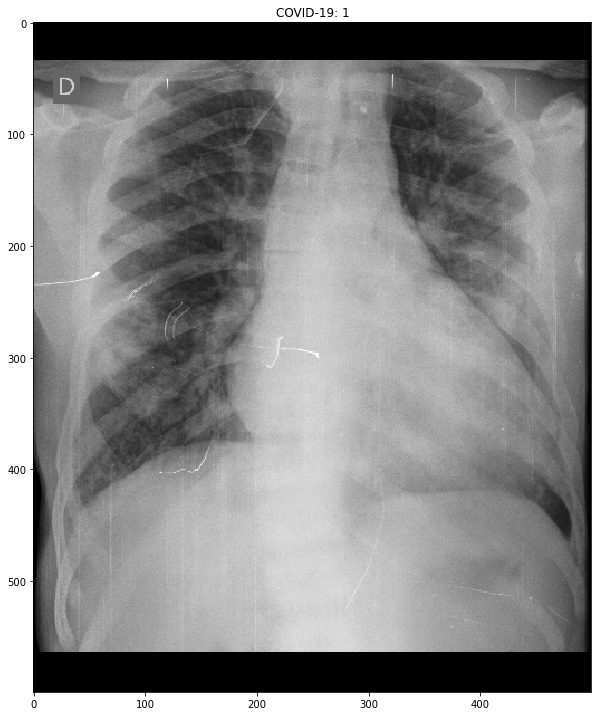

In [210]:
fig, ax1 = plt.subplots(1, 1, figsize = (10,15))


ax1.imshow(positive_sample_test, interpolation = 'none')

ax1.set_title('COVID-19: 1')


explanation 1 top labels[0] =  0


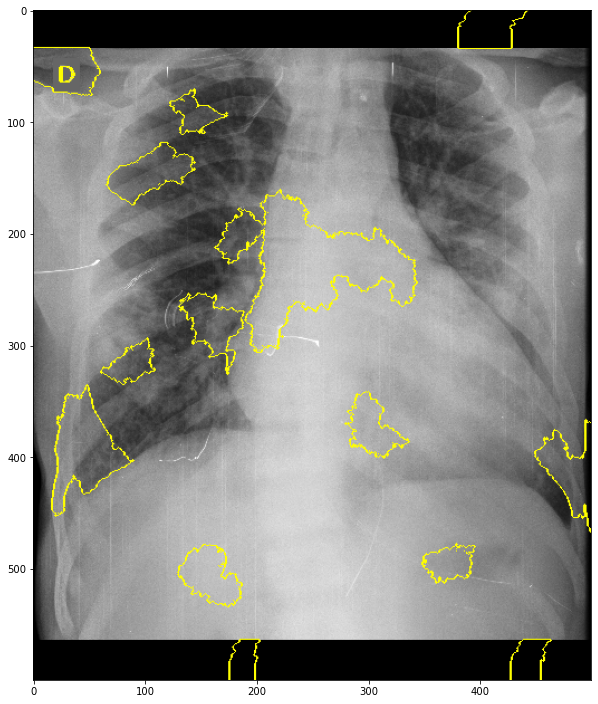

In [212]:
temp, mask = explanation_1.get_image_and_mask(explanation_1.top_labels[0], 
                                            positive_only=True, 
                                            num_features=20, 
                                            hide_rest=False)
plt.figure(figsize = (10,15))
print('explanation 1 top labels[0] = ', explanation_1.top_labels[0])
plt.imshow(mark_boundaries(temp, mask))

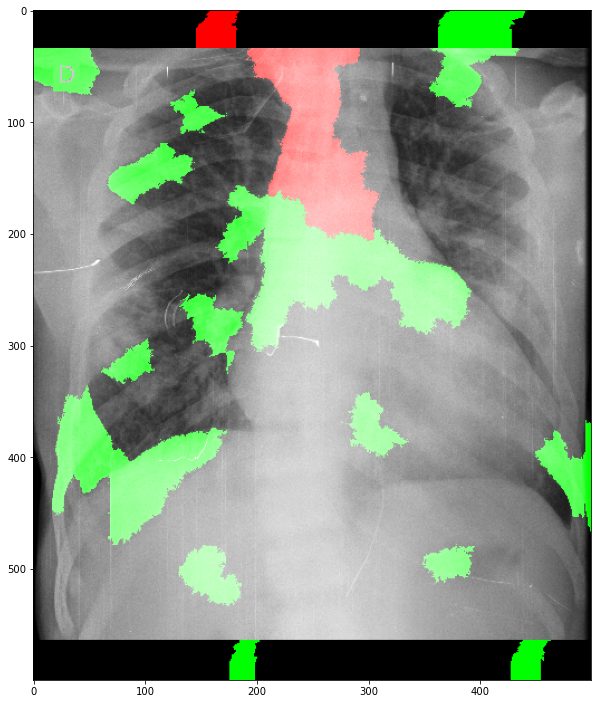

In [225]:
plt.figure(figsize = (10,15))
plt.imshow(temp)

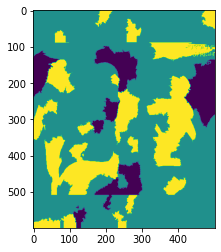

In [177]:
plt.imshow(mask)

The cluster with yellow circling shows the area supporting COVID-19-positive cases. From the third
X-ray, the green highlighted area represents the clusters or features that is
supporting COVID-19 patterns. Whereas the red area shows the area not supporting COVID-19-
positive cases. As we observe from these X-ray scans, it can be seen that the existence of a “shadow”
that is whitish around the corner of the lungs seems to be the main contributing factor to being
classified as COVID-19 positive. Whereas the red highlighted area seems to be outlining the clear
structure of the top of the lung, suggesting that the clear shape and structure of the lung would
mean the patient is healthy.


## Negative case LIME

In [227]:
%%time
'''
Hide color is the color for a superpixel turned OFF. Alternatively, 
if it is NONE, the superpixel will be replaced by the average of its pixels
'''
explanation_2 = explainer.explain_instance(negative_sample_test.astype('double'), 
                                         classifier_fn = new_model.predict, 
                                         top_labels=2, 
                                         hide_color=0, 
                                         num_samples=1000,
                                         segmentation_fn=segmenter
                                        )

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 130ms/step
Wall time: 45.2 s


Text(0.5, 1.0, 'COVID-19: 0')

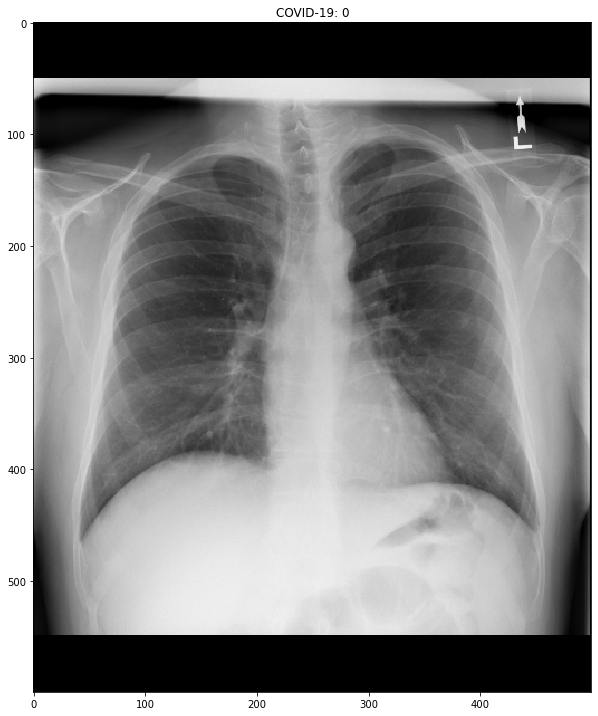

In [228]:
fig, ax1 = plt.subplots(1,1, figsize = (10,15))

ax1.imshow(test_x['images'][negative_sample_idx], interpolation = 'none')

ax1.set_title('COVID-19: 0')

explanation 2 top labels[0] =  0


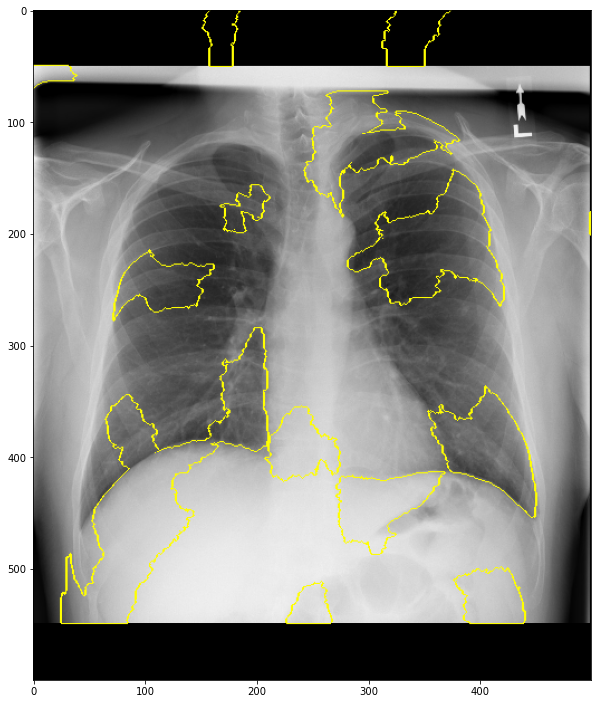

In [230]:
temp, mask = explanation_2.get_image_and_mask(explanation_2.top_labels[0], 
                                            positive_only=True, 
                                            num_features=20, 
                                            hide_rest=False)

plt.figure(figsize = (10,15))
print('explanation 2 top labels[0] = ', explanation_2.top_labels[0])
plt.imshow(mark_boundaries(temp, mask))

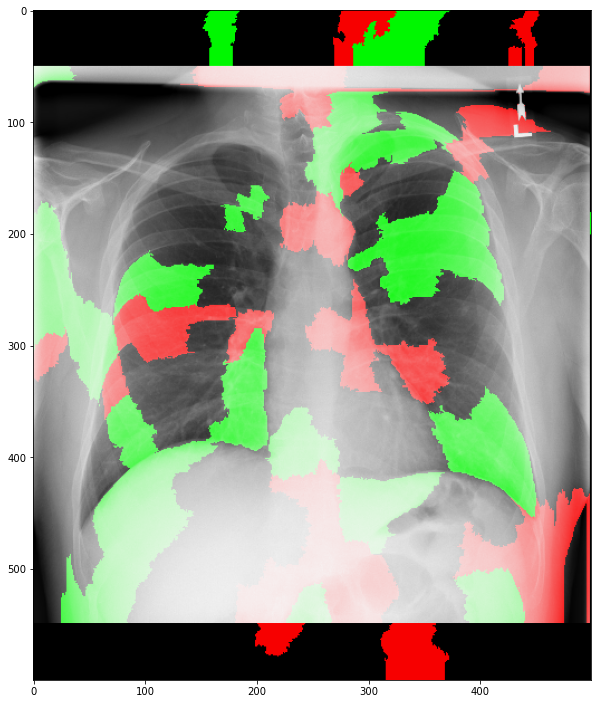

In [232]:
plt.figure(figsize = (10,15))
plt.imshow(temp)

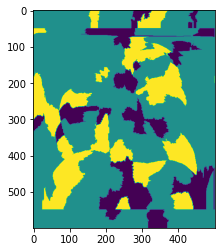

In [234]:
plt.imshow(mask)

The cluster with yellow circling shows the area supporting COVID-19 negative cases. From the third
X-ray scan in FIGURE 10, the green highlighted area represents the clusters or features that is
supporting COVID-19 negative patterns. Whereas the red area shows the area supporting COVID-19-
positive cases. Based on the second and third X-ray scans, it can be seen that the
edge of the lungs is highlighted, which suggests that the clear structure and shape of the lungs are
an indicator of a COVID-19-negative patient. From the third X-ray scan, it can be noticed that there is
a clear separation of green and red highlights around the two bottom corners of the right lung. This
shows that the “shadow” that the whitish area that is supporting the COVID-19 positive class, and
the green areas represent the clear edge of the lung supporting the COVID-19 negative class.

## Findings

### COVID19 X-Ray Classifier
#### Deep Convolutional Neural Network
The DCNN has resulted in 93% accuracy. The model has a reliable accuracy overall
but did not perform as well while considering the goal and purpose of the classifier. The 11 COVID19-positive patients that failed to identify correctly have motivated to consider the implementation of class weight.

#### Deep Convolutional Neural Network with Class Weight
The DCNN with class weights of 1 to 5 has resulted in a slight improvement in the ability to detect
COVID-19 patients. This is evident from the decrease or reduction of false positives.
However, it appears that class weight is insufficient to correctly identify these COVID-19-positive
patients as the false positives have only decreased to 6 as compared to 11 for the model without
class weight.

#### Deep Convolutional Neural Network with Data Augmentation
Image augmentation has been introduced to generate more variation of X-ray images to improve the ability to detect COVID-19-positive patients. The build of this model is the same as the DCNN with class weight except the input layer is replaced with the data augmentation layer.
The DCNN with image augmentation has the highest accuracy of 92%. The false positive has been reduced by another 2 as compared to DCNN with class weight.This suggests that the DCNN model weren’t able to capture all the possible variant of abnormalities
from COVID-19. This could be due to the 4 wrongly classified COVID-19-positive patient’s X-ray scans
being very similar to a COVID-19-negative patient, which could be an early stage of COVID-19.

### Local Interpretable Model-agnostic Explanations
The DCNN with Data Augmentation is selected as the best-performing model and utilized LIME to
explore the model predictions. The segmentation algorithm used is Quickshift with a kernel size of 5
and a max distance of 100. The LIME model is built on the classifier for positive and negative cases
separately to explore the key features identified by the classifier for two different cases.
COVID-19 Positive patient
An X-ray scan of COVID-19 positive patient is selected to explore the feature identified from the
DCNN classifier below.